In [ ]:
"""
File Created: 2023-07-17
Author: Patrick G. Cho
Contact: pcho@nd.edu
Purpose: Wavelet Analysis of Eastern Africa and Indonesian Precipitation Isotopes and Indian Walker Circulation Metric using iCESM LME.

Details:
We use the three fully forced simulations of the Last Millennium Ensemble from the the isotope enabled Community Earth System Model to analyze 
multi-decadal scale variability of water isotopes and it's relation to Walker Circulations. This analysis is specifically for the East African Short Rain season (OND).
"""

# Load Data and Packages

In [9]:
# Data Management
import pandas as pd
import xarray as xr
from netCDF4 import Dataset
import datetime as dt
import cftime
import os
from functools import reduce

# Plotting
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import regionmask

# Analysis
import numpy as np
import pyleoclim as pyleo
from amount_weighted_ann_mean import amount_weighted_ann_mean
from weighted_temporal_mean import weighted_temporal_mean

# Image Resolution on MacOS
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
def dslp_PWC (ds):
    
    # Clean Longitude
    ds = ds.assign_coords(lon=(((ds.lon+180)%360)-180))
    ds = ds.sortby(variables='lon',ascending=True)
    
    # Create Weights
    weights = np.cos(np.deg2rad(ds.lat))
    
    # Calculate Western Pacific Anomalies
    wslpP = ds.sel(lat=slice(-5,5),lon=slice(80,160)).weighted(weights).mean(dim=('lat','lon')).groupby('time.month')
    wslpclimP = ds.sel(lat=slice(-5,5),lon=slice(80,160),time=slice('1940','2005')).weighted(weights).mean(dim=('lat','lon')).groupby('time.month').mean(dim='time')
    wslpanomP = wslpP-wslpclimP
    
    # Calculate Eastern Pacific Anomalies; -160 to -80 E is the same as 160-80W
    eslpP = ds.sel(lat=slice(-5,5),lon=slice(-160,-80)).weighted(weights).mean(dim=('lat','lon')).groupby('time.month')
    eslpclimP = ds.sel(lat=slice(-5,5),lon=slice(-160,-80),time=slice('1940','2005')).weighted(weights).mean(dim=('lat','lon')).groupby('time.month').mean(dim='time') 
    eslpanomP = eslpP-eslpclimP
    
    # Calculate dSLP_PWC
    dslpP = eslpanomP - wslpanomP
    return dslpP

In [3]:
def ueq (ds):
    ds = ds.assign_coords(lon=(((ds.lon+180)%360)-180)).sortby(variables = 'lon',ascending = True)
    
    eraweights = np.cos(np.deg2rad(ds.lat))

    w = ds.sel(lat=slice(-5,5),lon=slice(60,90)).weighted(eraweights).mean(dim=('lat','lon')).groupby('time.month')
    wclim = ds.sel(lat=slice(-5,5),lon=slice(60,90),time=slice('1940','2005')).weighted(eraweights).mean(dim=('lat','lon')).groupby('time.month').mean(dim='time')
    ueqanom = w - wclim
    return ueqanom

In [21]:
def preprocess_dataset(file_path):
    ds = xr.open_dataset(file_path)
    ds = ds.rename({'lat': 'Latitude', 'lon': 'Longitude'})
    ds = ds.assign_coords(Longitude=((ds.Longitude + 180) % 360) - 180).sortby(variables=['Longitude', 'Latitude'], ascending=True)

    land_110 = regionmask.defined_regions.natural_earth_v5_0_0.land_110
    land_mask = land_110.mask_3D(ds, lon_name='Longitude', lat_name='Latitude').squeeze(drop=True)

    ds = ds.where(land_mask == 1)
    
    return ds

In [35]:
def extract_region_data(ds, latitude_range, longitude_range, weights, variable_name, suffix):
    region_data = ds.sel(Latitude=slice(*latitude_range), Longitude=slice(*longitude_range))[variable_name].weighted(weights).mean(dim=('Latitude', 'Longitude')).to_dataframe().reset_index()
    region_data = region_data.rename(columns={variable_name: f'{suffix}_{variable_name}'})
    return region_data

regions = {'horn': (0, 15, 25, 60), 'k': (-20, 0, 25, 60), 'indo': (-10, 10, 90, 120)}

data_frames = []

for region_prefix, (lat_start, lat_end, lon_start, lon_end) in regions.items():
    for i in range(1, 4):
        ds = globals()[f'ds{i}']
        region_data = extract_region_data(ds, (lat_start, lat_end), (lon_start, lon_end), weights, 'PREC_d18O', f'{region_prefix}{i}')
        data_frames.append(region_data)

In [57]:
path = '/Users/cpatrickfly/Library/CloudStorage/GoogleDrive-pcho@nd.edu/Shared drives/PhD Research/IWC Precipitation Isotopes/02_RawData/'

ds1 = preprocess_dataset(path + '230714_PC_iLME_d18OPm_001.nc')
ds2 = preprocess_dataset(path + '230714_PC_iLME_d18OPm_002.nc')
ds3 = preprocess_dataset(path + '230714_PC_iLME_d18OPm_003.nc')

months = ds1['time'].dt.month
sr1 = ds1.where(months.isin([10, 11, 12]), drop=True).resample(time='Y').mean()
sr2 = ds2.where(months.isin([10, 11, 12]), drop=True).resample(time='Y').mean()
sr3 = ds3.where(months.isin([10, 11, 12]), drop=True).resample(time='Y').mean()

/Users/cpatrickfly/miniconda3/envs/IWC_Isotopes/lib/python3.11/site-packages/regionmask/core/mask.py:178: FutureWarning: Passing 'lon_name' and 'lat_name' was deprecated in v0.10.0. Please pass the coordinates directly, e.g., `mask*(ds[lon_name], ds[lat_name])`.
  warnings.warn(
/Users/cpatrickfly/miniconda3/envs/IWC_Isotopes/lib/python3.11/site-packages/regionmask/core/mask.py:178: FutureWarning: Passing 'lon_name' and 'lat_name' was deprecated in v0.10.0. Please pass the coordinates directly, e.g., `mask*(ds[lon_name], ds[lat_name])`.
  warnings.warn(
/Users/cpatrickfly/miniconda3/envs/IWC_Isotopes/lib/python3.11/site-packages/regionmask/core/mask.py:178: FutureWarning: Passing 'lon_name' and 'lat_name' was deprecated in v0.10.0. Please pass the coordinates directly, e.g., `mask*(ds[lon_name], ds[lat_name])`.
  warnings.warn(


In [58]:
# SLP and U Winds Cleaning

slprunnames = ['b.ie12.B1850CN.f19_g16.001.slp.mth.085001-200512.nc',
              'b.ie12.B1850C5CN.f19_g16.LME.002.slp.mth.085001-200512.nc',
               'b.ie12.B1850C5CN.f19_g16.LME.003.slp.mth.085001-200512.nc']
urunnames = ['b.ie12.B1850CN.f19_g16.001.u10.mth.0850-200512.nc',
            'b.ie12.B1850C5CN.f19_g16.LME.002.u10.mth.0850-200512.nc',
            'b.ie12.B1850C5CN.f19_g16.LME.003.u10.mth.0850-200512.nc']

# Annual Average
s1o = dslp_PWC(xr.open_dataset(path + slprunnames[0]).PSL).resample(time='Y').mean().to_dataframe().reset_index().rename(columns = {'PSL':'SLP_001'})
s2o = dslp_PWC(xr.open_dataset(path + slprunnames[1]).PSL).resample(time='Y').mean().to_dataframe().reset_index().rename(columns = {'PSL':'SLP_002'})
s3o = dslp_PWC(xr.open_dataset(path + slprunnames[2]).PSL).resample(time='Y').mean().to_dataframe().reset_index().rename(columns = {'PSL':'SLP_003'})

u1o = ueq(xr.open_dataset(path + urunnames[0]).U10).resample(time='Y').mean().to_dataframe().reset_index().rename(columns = {'U10':'U_001'})
u2o = ueq(xr.open_dataset(path + urunnames[1]).U10).resample(time='Y').mean().to_dataframe().reset_index().rename(columns = {'U10':'U_002'})
u3o = ueq(xr.open_dataset(path + urunnames[2]).U10).resample(time='Y').mean().to_dataframe().reset_index().rename(columns = {'U10':'U_003'})

In [95]:
regions = {'horn': (0, 15, 25, 60), 'k': (-20, 0, 25, 60), 'indo': (-10, 10, 90, 120)}

data_frames = []

for region_prefix, (lat_start, lat_end, lon_start, lon_end) in regions.items():
    region_data = [extract_region_data(globals()[f'sr{i}'], (lat_start, lat_end), (lon_start, lon_end), wgtO, 'PREC_d18O', f'{region_prefix}{i}') for i in range(1, 4)]
    data_frames.extend(region_data)

# Create DFo for Analysis; OND d18OP and Annual IWC and PWC metric
dfo = reduce(lambda left, right: pd.merge(left, right, on=['time'], how='outer'), data_frames)

year = []
for i in np.arange(len(dfo.time.values)):
    y = dfo.time.values[i].year
    year.append(y)
dfo['Year'] = year
dfo = dfo.set_index('Year')

# S_o is PWC index calculated from the SLP of the iLME runs; U_o is the IWC index calculated from the 10m U winds of the iLME runs
dfo['SLP_PWC_001']  = s1o.SLP_001.values
dfo['SLP_PWC_002']  = s2o.SLP_002.values
dfo['SLP_PWC_003']  = s3o.SLP_003.values
dfo['UEQ_001']      = u1o.U_001.values
dfo['UEQ_002']      = u2o.U_002.values
dfo['UEQ_003']      = u3o.U_003.values

In [102]:
# Overlapping time period with ECHAM5-wiso (1958 - 2005 analysis)
dfMod = dfo[(dfo.index >= 1958) & (dfo.index <= 2005)]

# Create PyleoSeries

In [98]:
"""
This is very repetitive, but it makes it easier for me to keep track of the series... User can modify it as they wish. 
"""
# iLME Full Forcing 001; OND
h1 = pyleo.Series(time = dfo.index, value = dfo.horn1_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
k1 = pyleo.Series(time = dfo.index, value = dfo.k1_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
i1 = pyleo.Series(time = dfo.index, value = dfo.indo1_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
p1 = pyleo.Series(time = dfo.index, value = dfo.SLP_PWC_001, label = '$\delta SLP_{PWC}$', 
                   time_name = 'Time', value_name = 'SLP Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
u1 = pyleo.Series(time = dfo.index, value = dfo.UEQ_001, label = 'U_{Eq}$', 
                   time_name = 'Time', value_name = 'Wind Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()

# iLME Full Forcing 002; OND
h2 = pyleo.Series(time = dfo.index, value = dfo.horn2_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
k2 = pyleo.Series(time = dfo.index, value = dfo.k2_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
i2 = pyleo.Series(time = dfo.index, value = dfo.indo2_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
p2 = pyleo.Series(time = dfo.index, value = dfo.SLP_PWC_002, label = '$\delta SLP_{PWC}$', 
                   time_name = 'Time', value_name = 'SLP Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
u2 = pyleo.Series(time = dfo.index, value = dfo.UEQ_002, label = 'U_{Eq}$', 
                   time_name = 'Time', value_name = 'Wind Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()

# iLME Full Forcing 003; OND
h3 = pyleo.Series(time = dfo.index, value = dfo.horn3_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
k3 = pyleo.Series(time = dfo.index, value = dfo.k3_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
i3 = pyleo.Series(time = dfo.index, value = dfo.indo3_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
p3 = pyleo.Series(time = dfo.index, value = dfo.SLP_PWC_003, label = '$\delta SLP_{PWC}$', 
                   time_name = 'Time', value_name = 'SLP Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
u3 = pyleo.Series(time = dfo.index, value = dfo.UEQ_003, label = 'U_{Eq}$', 
                   time_name = 'Time', value_name = 'Wind Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()

Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order


In [104]:
# iLME for 1958-2005

# iLME Full Forcing 001; OND
h1m = pyleo.Series(time = dfMod.index, value = dfMod.horn1_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
k1m = pyleo.Series(time = dfMod.index, value = dfMod.k1_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
i1m = pyleo.Series(time = dfMod.index, value = dfMod.indo1_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
p1m = pyleo.Series(time = dfMod.index, value = dfMod.SLP_PWC_001, label = '$\delta SLP_{PWC}$', 
                   time_name = 'Time', value_name = 'SLP Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
u1m = pyleo.Series(time = dfMod.index, value = dfMod.UEQ_001, label = 'U_{Eq}$', 
                   time_name = 'Time', value_name = 'Wind Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()

# iLME Full Forcing 002; OND
h2m = pyleo.Series(time = dfMod.index, value = dfMod.horn2_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
k2m = pyleo.Series(time = dfMod.index, value = dfMod.k2_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
i2m = pyleo.Series(time = dfMod.index, value = dfMod.indo2_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
p2m = pyleo.Series(time = dfMod.index, value = dfMod.SLP_PWC_002, label = '$\delta SLP_{PWC}$', 
                   time_name = 'Time', value_name = 'SLP Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
u2m = pyleo.Series(time = dfMod.index, value = dfMod.UEQ_002, label = 'U_{Eq}$', 
                   time_name = 'Time', value_name = 'Wind Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()

# iLME Full Forcing 003; OND
h3m = pyleo.Series(time = dfMod.index, value = dfMod.horn3_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
k3m = pyleo.Series(time = dfMod.index, value = dfMod.k3_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
i3m = pyleo.Series(time = dfMod.index, value = dfMod.indo3_PREC_d18O, label = '$\delta^{18}$$O_{P}$', 
                   time_name = 'Time', value_name = '$\delta^{18}$$O_{P}$ Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
p3m = pyleo.Series(time = dfMod.index, value = dfMod.SLP_PWC_003, label = '$\delta SLP_{PWC}$', 
                   time_name = 'Time', value_name = 'SLP Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()
u3m = pyleo.Series(time = dfMod.index, value = dfMod.UEQ_003, label = 'U_{Eq}$', 
                   time_name = 'Time', value_name = 'Wind Anomalies', 
                   time_unit = 'Year C.E.', value_unit = 'permille').standardize()

Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order
Time axis values sorted in ascending order


# Coherence Analysis

In [105]:
# iLME 001
    # Horn of Africa
coh_sigU1  = h1.wavelet_coherence(u1).signif_test(method='ar1sim', number=1000)
coh_sigP1  = h1.wavelet_coherence(p1).signif_test(method='ar1sim', number=1000)
    # Kenya
coh_sigU1k = k1.wavelet_coherence(u1).signif_test(method='ar1sim', number=1000)
coh_sigP1k = k1.wavelet_coherence(p1).signif_test(method='ar1sim', number=1000)
    # Indonesia
coh_sigU1i = i1.wavelet_coherence(u1).signif_test(method='ar1sim', number=1000)
coh_sigP1i = i1.wavelet_coherence(p1).signif_test(method='ar1sim', number=1000)

# iLME 002
    # Horn of Africa
coh_sigU2  = h2.wavelet_coherence(u2).signif_test(method='ar1sim', number=1000)
coh_sigP2  = h2.wavelet_coherence(p2).signif_test(method='ar1sim', number=1000)
    # Kenya
coh_sigU2k = k2.wavelet_coherence(u2).signif_test(method='ar1sim', number=1000)
coh_sigP2k = k1.wavelet_coherence(p2).signif_test(method='ar1sim', number=1000)
    # Indonesia
coh_sigU2i = i2.wavelet_coherence(u2).signif_test(method='ar1sim', number=1000)
coh_sigP2i = i2.wavelet_coherence(p2).signif_test(method='ar1sim', number=1000)

# iLME 003
    # Horn of Africa
coh_sigU3  = h3.wavelet_coherence(u3).signif_test(method='ar1sim', number=1000)
coh_sigP3  = h3.wavelet_coherence(p3).signif_test(method='ar1sim', number=1000)
    # Kenya
coh_sigU3k = k3.wavelet_coherence(u3).signif_test(method='ar1sim', number=1000)
coh_sigP3k = k3.wavelet_coherence(p3).signif_test(method='ar1sim', number=1000)
    # Indonesia
coh_sigU3i = i3.wavelet_coherence(u3).signif_test(method='ar1sim', number=1000)
coh_sigP3i = i3.wavelet_coherence(p3).signif_test(method='ar1sim', number=1000)

Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:44<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:44<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:44<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:44<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:44<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:44<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:45<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:44<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:46<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:45<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:45<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:45<00:00,
Performing wavelet coherence

In [106]:
# Wavelet for 1958-2005
# iLME 001
    # Horn of Africa
coh_sigU1m  = h1m.wavelet_coherence(u1m).signif_test(method='ar1sim', number=1000)
coh_sigP1m  = h1m.wavelet_coherence(p1m).signif_test(method='ar1sim', number=1000)
    # Kenya
coh_sigU1km = k1m.wavelet_coherence(u1m).signif_test(method='ar1sim', number=1000)
coh_sigP1km = k1m.wavelet_coherence(p1m).signif_test(method='ar1sim', number=1000)
    # Indonesia
coh_sigU1im = i1m.wavelet_coherence(u1m).signif_test(method='ar1sim', number=1000)
coh_sigP1im = i1m.wavelet_coherence(p1m).signif_test(method='ar1sim', number=1000)

# iLME 002
    # Horn of Africa
coh_sigU2m  = h2m.wavelet_coherence(u2m).signif_test(method='ar1sim', number=1000)
coh_sigP2m  = h2m.wavelet_coherence(p2m).signif_test(method='ar1sim', number=1000)
    # Kenya
coh_sigU2km = k2m.wavelet_coherence(u2m).signif_test(method='ar1sim', number=1000)
coh_sigP2km = k1m.wavelet_coherence(p2m).signif_test(method='ar1sim', number=1000)
    # Indonesia
coh_sigU2im = i2m.wavelet_coherence(u2m).signif_test(method='ar1sim', number=1000)
coh_sigP2im = i2m.wavelet_coherence(p2m).signif_test(method='ar1sim', number=1000)

# iLME 003
    # Horn of Africa
coh_sigU3m  = h3m.wavelet_coherence(u3m).signif_test(method='ar1sim', number=1000)
coh_sigP3m  = h3m.wavelet_coherence(p3m).signif_test(method='ar1sim', number=1000)
    # Kenya
coh_sigU3km = k3m.wavelet_coherence(u3m).signif_test(method='ar1sim', number=1000)
coh_sigP3km = k3m.wavelet_coherence(p3m).signif_test(method='ar1sim', number=1000)
    # Indonesia
coh_sigU3im = i3m.wavelet_coherence(u3m).signif_test(method='ar1sim', number=1000)
coh_sigP3im = i3m.wavelet_coherence(p3m).signif_test(method='ar1sim', number=1000)

Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence on surrogate pairs: 100%|█| 1000/1000 [00:00<00:00,
Performing wavelet coherence

## Figure 3 and Figure S3

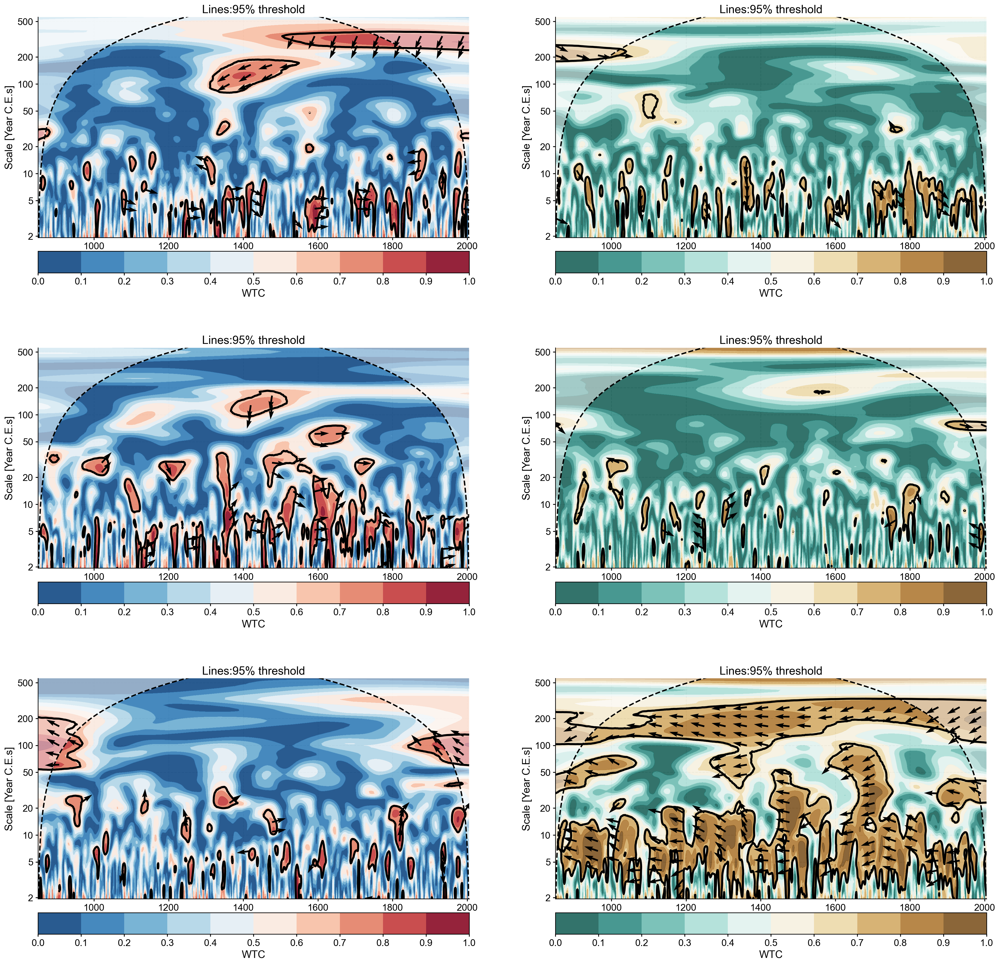

In [109]:
# iLME 002

fig = plt.figure(figsize=(25,25))
gs = gridspec.GridSpec(nrows=3, ncols=3, height_ratios=[1,1,1], width_ratios=[1,1,0], figure=fig)
gs.update(left=0.1, right=0.95, wspace = 0.3, hspace=0.2)

ax1 = fig.add_subplot(gs[0,0])
coh_sigU2.plot(ax = ax1, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax2 = fig.add_subplot(gs[0,1])
coh_sigP2.plot(ax = ax2, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax3 = fig.add_subplot(gs[1,0])
coh_sigU2k.plot(ax = ax3, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax4 = fig.add_subplot(gs[1,1])
coh_sigP2k.plot(ax = ax4, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax5 = fig.add_subplot(gs[2,0])
coh_sigU2i.plot(ax = ax5, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax6 = fig.add_subplot(gs[2,1])
coh_sigP2i.plot(ax = ax6, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

fig.tight_layout()

## Figure S5

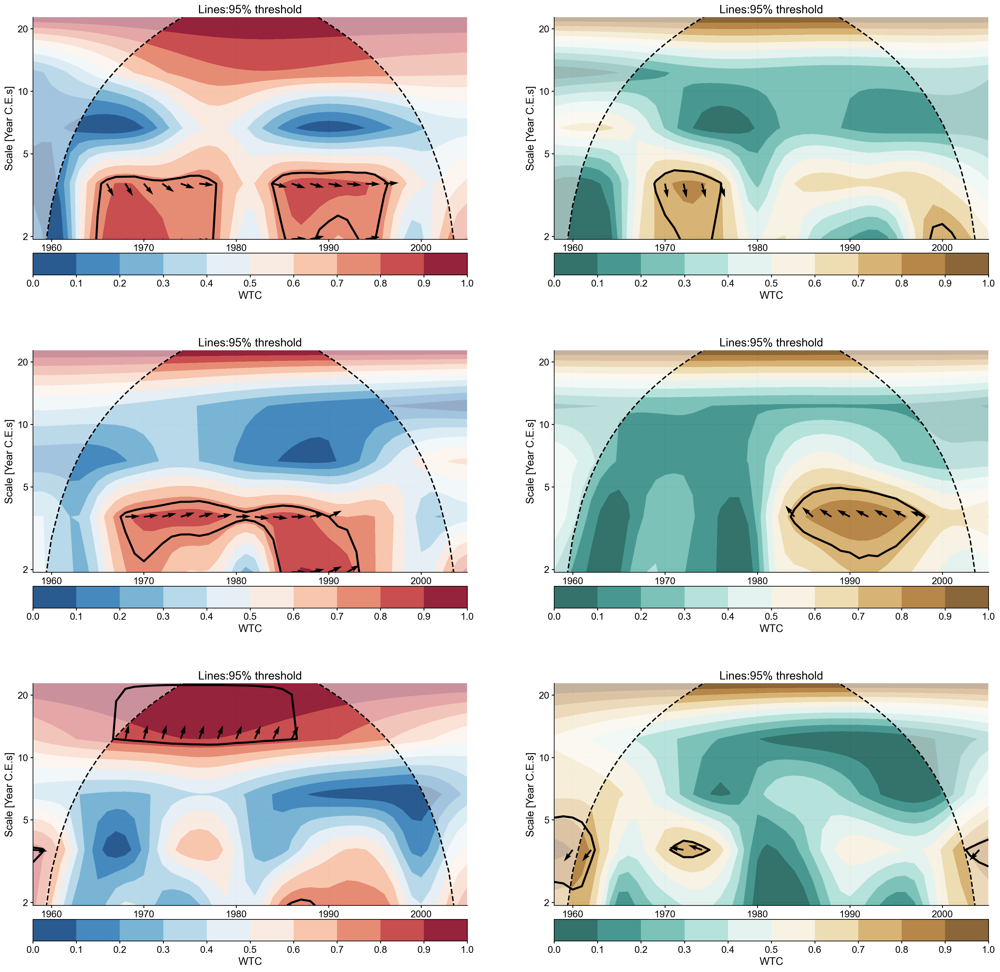

In [110]:
# iLME 002; 1958-2005

fig = plt.figure(figsize=(25,25))
gs = gridspec.GridSpec(nrows=3, ncols=3, height_ratios=[1,1,1], width_ratios=[1,1,0], figure=fig)
gs.update(left=0.1, right=0.95, wspace = 0.3, hspace=0.2)

ax1 = fig.add_subplot(gs[0,0])
coh_sigU2m.plot(ax = ax1, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax2 = fig.add_subplot(gs[0,1])
coh_sigP2m.plot(ax = ax2, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax3 = fig.add_subplot(gs[1,0])
coh_sigU2km.plot(ax = ax3, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax4 = fig.add_subplot(gs[1,1])
coh_sigP2km.plot(ax = ax4, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax5 = fig.add_subplot(gs[2,0])
coh_sigU2im.plot(ax = ax5, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax6 = fig.add_subplot(gs[2,1])
coh_sigP2im.plot(ax = ax6, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

fig.tight_layout()

## Figure S6

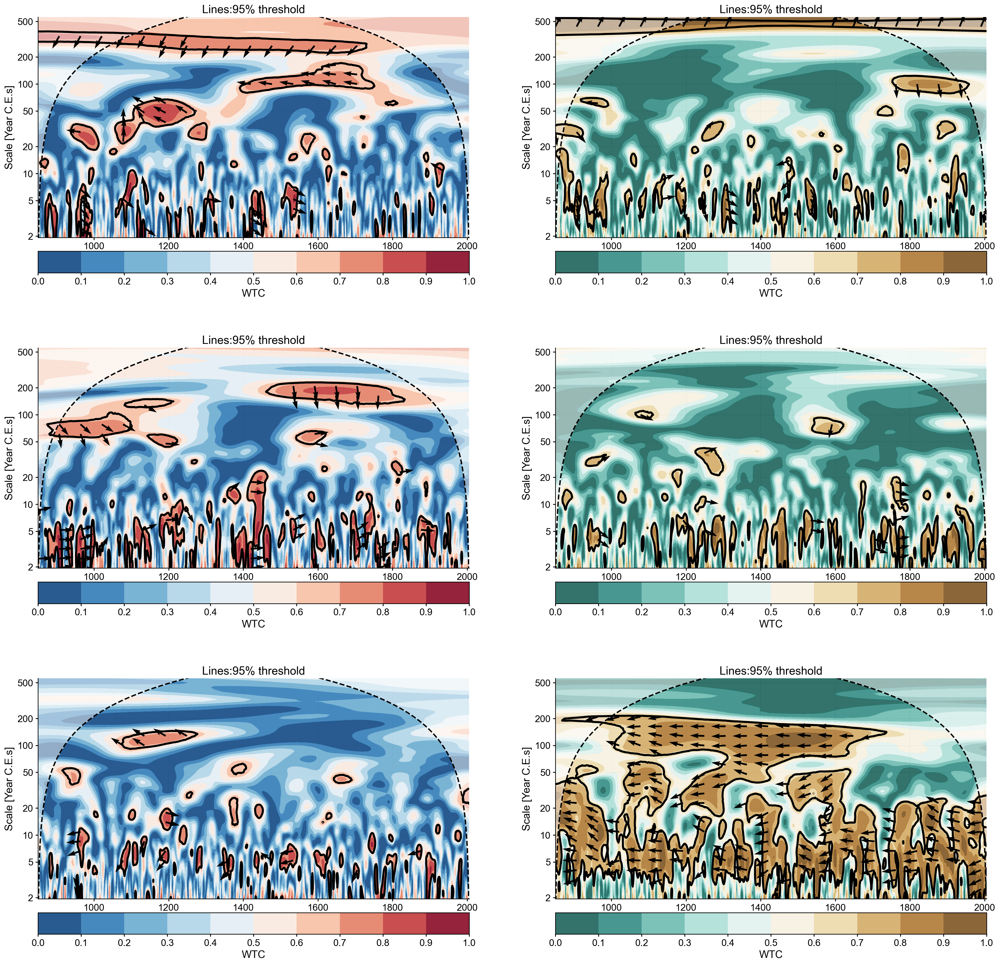

In [111]:
# iLME 001

fig = plt.figure(figsize=(25,25))
gs = gridspec.GridSpec(nrows=3, ncols=3, height_ratios=[1,1,1], width_ratios=[1,1,0], figure=fig)
gs.update(left=0.1, right=0.95, wspace = 0.3, hspace=0.2)

ax1 = fig.add_subplot(gs[0,0])
coh_sigU1.plot(ax = ax1, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax2 = fig.add_subplot(gs[0,1])
coh_sigP1.plot(ax = ax2, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax3 = fig.add_subplot(gs[1,0])
coh_sigU1k.plot(ax = ax3, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax4 = fig.add_subplot(gs[1,1])
coh_sigP1k.plot(ax = ax4, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax5 = fig.add_subplot(gs[2,0])
coh_sigU1i.plot(ax = ax5, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax6 = fig.add_subplot(gs[2,1])
coh_sigP1i.plot(ax = ax6, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

fig.tight_layout()

## Figure S7

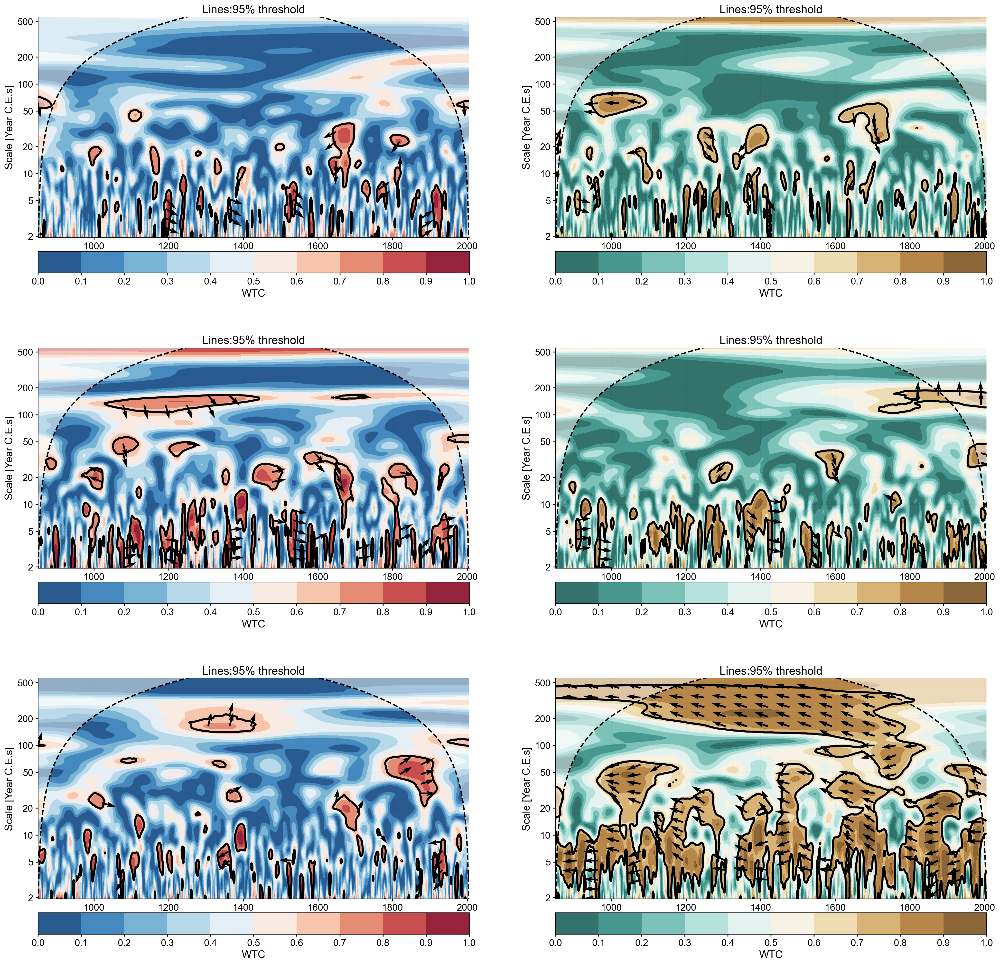

In [112]:
# iLME 003

fig = plt.figure(figsize=(25,25))
gs = gridspec.GridSpec(nrows=3, ncols=3, height_ratios=[1,1,1], width_ratios=[1,1,0], figure=fig)
gs.update(left=0.1, right=0.95, wspace = 0.3, hspace=0.2)

ax1 = fig.add_subplot(gs[0,0])
coh_sigU3.plot(ax = ax1, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax2 = fig.add_subplot(gs[0,1])
coh_sigP3.plot(ax = ax2, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax3 = fig.add_subplot(gs[1,0])
coh_sigU3k.plot(ax = ax3, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax4 = fig.add_subplot(gs[1,1])
coh_sigP3k.plot(ax = ax4, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax5 = fig.add_subplot(gs[2,0])
coh_sigU3i.plot(ax = ax5, var = 'wtc', contourf_style = {'cmap':'RdBu_r', 'alpha' :0.9}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

ax6 = fig.add_subplot(gs[2,1])
coh_sigP3i.plot(ax = ax6, var = 'wtc', contourf_style = {'cmap':'BrBG_r', 'alpha' :0.8}, signif_clr = 'black', signif_linewidths = 3,
               cbar_style = {'location':'bottom', 'orientation':'horizontal'})

fig.tight_layout()